# **EDA for Data Unificated**

# 0.0. Imports and Configurations

In [1]:
# Install project package

%pip install -q -e ..

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.3 -> 26.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# Install dependency

%pip install -q boto3

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.3 -> 26.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
# Libraries

import os
import sys
from dotenv import load_dotenv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn as sns
from scipy.stats import kurtosis
from scipy.stats import skew
import scipy.stats as st
from sklearn.feature_selection import mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
import shap
from statsmodels.stats.diagnostic import acorr_ljungbox
import warnings
import tqdm as tqdm

c:\Users\ADMIN\AppData\Local\Programs\Python\Python313\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
# Load environment variables

from dotenv import load_dotenv
from pathlib import Path

load_dotenv()

EDA_CONTENT_PATH = os.getenv("EDA_CONTENT_PATH")

In [5]:
# Load the module from configs package

from configs.load_unified_data_5d_pred import load_data

In [6]:
# Load data

df = load_data()

In [7]:
df.shape

(3968, 60)

In [8]:
df.sample(5)

,date,Close,High,Low,Open,Volume,Scaled_SMA20,Scaled_SMA50,Scaled_EMA20,Scaled_EMA50,...,VIX_close,GOLD_close,OIL_close,TLT_close,RSP_close,TNX_close,IWM_close,UUP_close,MSTR_close,SPY_close
1354,2018-11-20,4451.870117,4951.609863,4272.109863,4863.930176,8.428290e+09,-1586.538403,-1852.474512,-1389.047200,-1743.473796,...,22.480000,1219.000000,53.430000,92.892784,85.843620,3.048,132.880234,21.590370,12.302000,235.509811
1341,2018-11-07,6530.140137,6552.160156,6468.310059,6468.500000,4.941260e+09,94.518652,27.657119,92.499668,30.079314,...,16.360001,1226.199951,61.669998,90.842125,90.335892,3.213,143.274734,21.398048,12.986000,250.570221
1475,2019-03-21,4029.326904,4097.359863,4005.151367,4083.953857,1.083121e+10,84.235315,226.274673,67.830887,146.438737,...,13.630000,1306.099976,59.980000,100.165558,92.784737,2.537,142.177856,21.763397,14.962000,256.494812
666,2017-01-01,998.325012,1003.080017,958.698975,963.658020,1.477750e+08,126.858862,200.166592,106.494680,181.605246,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3672,2025-03-26,86900.882812,88292.156250,85861.453125,87460.234375,2.670405e+10,2691.348437,-2876.354219,1083.334431,-1984.288957,...,18.330000,3020.899902,69.650002,84.681252,172.050247,4.338,203.398087,27.703844,329.309998,562.145813


# 1.0. General Stats 

In [9]:
# Dataset dimensions

df.shape

(3968, 60)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3968 entries, 0 to 3967
Data columns (total 60 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   date                       3968 non-null   object 
 1   Close                      3965 non-null   float64
 2   High                       3965 non-null   float64
 3   Low                        3965 non-null   float64
 4   Open                       3965 non-null   float64
 5   Volume                     3965 non-null   float64
 6   Scaled_SMA20               3946 non-null   float64
 7   Scaled_SMA50               3916 non-null   float64
 8   Scaled_EMA20               3965 non-null   float64
 9   Scaled_EMA50               3965 non-null   float64
 10  Scaled_HMA20               3943 non-null   float64
 11  Scaled_HMA50               3910 non-null   float64
 12  Momentum_20p               3945 non-null   float64
 13  Momentum_50p               3915 non-null   float

In [11]:
# Target distribution

df["Target"].value_counts(normalize = True)

Target
Bullish    0.393993
Neutral    0.306411
Bearish    0.299596
Name: proportion, dtype: float64

In [12]:
# Numerical variables summary

col_nums = df.select_dtypes(['int64', 'float64']).columns

var_num_stats_pd = pd.DataFrame({
    'Mean': df[col_nums].mean(),
    'Median': df[col_nums].median(),
    'Mode': df[col_nums].mode().iloc[0],
    'Variance': df[col_nums].var(),
    'Std': df[col_nums].std(),
    'Min': df[col_nums].min(),
    'Max': df[col_nums].max(),
    'Q1': df[col_nums].quantile(0.25),
    'Q2': df[col_nums].quantile(0.5),
    'Q3': df[col_nums].quantile(0.75),
    'IQR': df[col_nums].quantile(0.75) - df[col_nums].quantile(0.25)
})

var_num_stats_pd

,Mean,Median,Mode,Variance,Std,Min,Max,Q1,Q2,Q3,IQR
Close,2.823540e+04,1.175828e+04,2.361530e+02,1.024232e+09,3.200363e+04,2.104950e+02,1.247525e+05,3.951600e+03,1.175828e+04,4.356511e+04,3.961351e+04
High,2.877889e+04,1.196808e+04,2.670030e+02,1.058372e+09,3.253262e+04,2.238330e+02,1.261981e+05,4.040700e+03,1.196808e+04,4.424067e+04,4.019997e+04
Low,2.761581e+04,1.144390e+04,4.290770e+02,9.868314e+08,3.141387e+04,1.995670e+02,1.231960e+05,3.868870e+03,1.144390e+04,4.261857e+04,3.874970e+04
Open,2.821208e+04,1.174987e+04,1.776030e+04,1.023282e+09,3.198878e+04,2.100680e+02,1.247521e+05,3.946685e+03,1.174987e+04,4.350514e+04,3.955845e+04
Volume,2.263044e+10,1.828331e+10,1.060090e+07,5.251096e+20,2.291527e+10,1.060090e+07,3.509679e+11,3.369860e+09,1.828331e+10,3.424406e+10,3.087420e+10
Scaled_SMA20,2.205855e+02,1.264056e+01,-1.544423e+04,7.430715e+06,2.725934e+03,-1.544423e+04,1.669696e+04,-5.047369e+02,1.264056e+01,7.878760e+02,1.292613e+03
Scaled_SMA50,5.624082e+02,3.767898e+01,-2.259806e+04,2.160496e+07,4.648114e+03,-2.259806e+04,2.564183e+04,-7.951763e+02,3.767898e+01,1.621453e+03,2.416629e+03
Scaled_EMA20,2.181881e+02,1.312122e+01,-1.302227e+04,5.546952e+06,2.355197e+03,-1.302227e+04,1.527298e+04,-4.209582e+02,1.312122e+01,7.259087e+02,1.146867e+03
Scaled_EMA50,5.659638e+02,3.428911e+01,-1.924356e+04,1.588477e+07,3.985570e+03,-1.924356e+04,2.224318e+04,-5.748299e+02,3.428911e+01,1.410470e+03,1.985300e+03
Scaled_HMA20,1.745151e+01,1.553857e+00,-1.165984e+04,2.449198e+06,1.564991e+03,-1.165984e+04,1.051979e+04,-3.174512e+02,1.553857e+00,3.403894e+02,6.578406e+02


# 1.1. Duplicated Rows Count

In [13]:
# Duplicated rows count

print(f"Duplicated rows count: {df.duplicated().sum()}")

Duplicated rows count: 0


# 1.2. Missing Values Count

Missing values count: 35170
------------------------------------------------------------


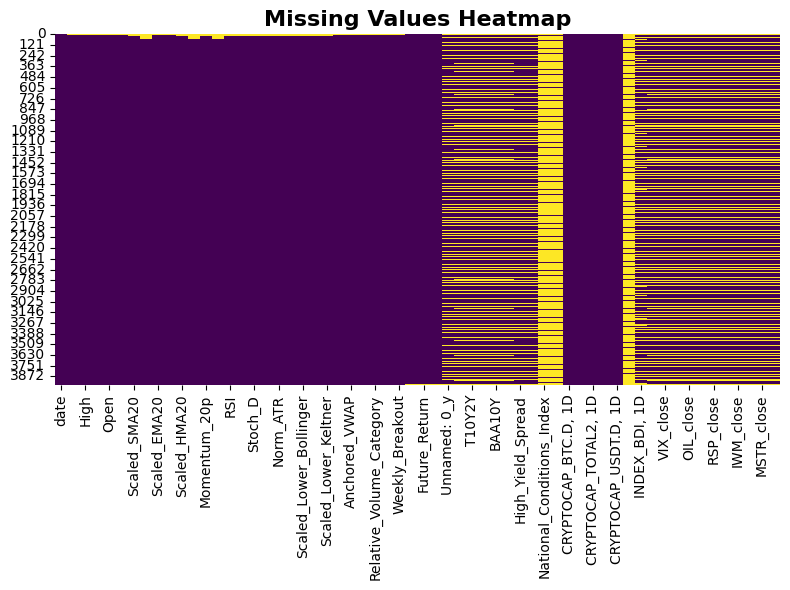

In [14]:
# Missing values count

print(f"Missing values count: {df.isnull().sum().sum()}")

print("--" * 30)

# Null values Heatmap

plt.figure(figsize = (8, 6))
sns.heatmap(df.isnull(), cbar = False, cmap = 'viridis')
plt.title('Missing Values Heatmap', fontsize = 16, fontweight = 'bold')
plt.tight_layout()

# Save

plt.savefig(os.path.join(EDA_CONTENT_PATH, 'missing_values_heatmap_for_5d_pred.png'), dpi = 300)

plt.show()

In [15]:
print(df.isnull().sum().sort_values(ascending = False))

FRED_WM2NS, 1D               3407
National_Conditions_Index    3402
Financial_Stress_Index       3402
INDEX_BDI, 1D                1264
BAA10Y                       1256
T10Y2Y                       1252
T10Y3M                       1252
T5YIE                        1252
EFFR                         1240
GOLD_close                   1238
TNX_close                    1238
RSP_close                    1237
IWM_close                    1237
TLT_close                    1237
OIL_close                    1237
VIX_close                    1237
UUP_close                    1237
SPY_close                    1237
MSTR_close                   1237
Unnamed: 0                   1235
High_Yield_Spread            1132
Corporate_Bond_Spread        1132
Unnamed: 0_y                 1098
Scaled_HMA50                   58
Momentum_50p                   53
Scaled_SMA50                   52
Scaled_HMA20                   25
WilliamsR                      23
Scaled_Upper_Keltner           23
Scaled_Lower_K

# 2.0. Kurtosis and Skewness Analysis

In [16]:
# Kurtosis and Skew 

# Numerical columns

col_nums = df.select_dtypes(['int64', 'float64']).columns

results = []

for col in col_nums:

    kurt = kurtosis(df[col].dropna())
    skew_val = skew(df[col].dropna())
    
    results.append({
        'Column': col,
        'Kurtosis': kurt,
        'Skew': skew_val
    })

kurtosis_skew = pd.DataFrame(results)

# Show results

kurtosis_skew

,Column,Kurtosis,Skew
0,Close,0.591235,1.266542
1,High,0.549771,1.254445
2,Low,0.646874,1.282512
3,Open,0.596394,1.267875
4,Volume,12.809384,2.000946
5,Scaled_SMA20,5.927926,0.453451
6,Scaled_SMA50,4.671802,0.574148
7,Scaled_EMA20,6.045782,0.478720
8,Scaled_EMA50,4.614711,0.674635
9,Scaled_HMA20,6.467094,-0.154864


# 3.0. Target Variable Analysis

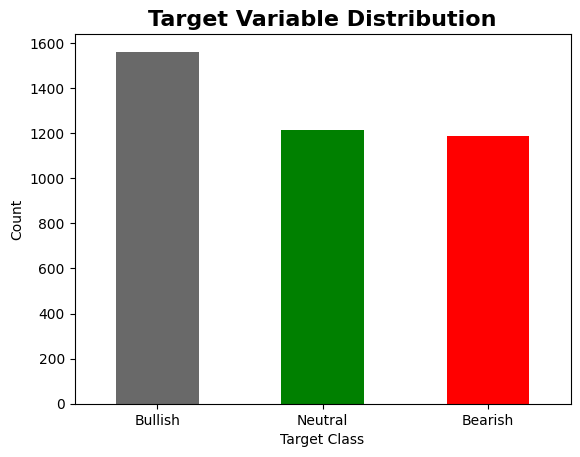

In [17]:
# Target distribution

df['Target'].value_counts().plot(kind = 'bar', color = ["dimgray", "green", "red"])

plt.title('Target Variable Distribution', fontsize = 16, fontweight = 'bold')
plt.xlabel('Target Class', fontsize = 10)
plt.ylabel('Count', fontsize = 10)
plt.xticks(rotation = 0)

# Save

plt.savefig(os.path.join(EDA_CONTENT_PATH, 'target_distribution_for_5d_pred.png'), dpi = 300)

plt.show()

# 4.0. Kolmogorov-Smirnov Test

In [18]:
# Delve into the distribution of numerical features

warnings.filterwarnings("ignore", category = RuntimeWarning)

distributions = [st.norm, st.expon, st.gamma, st.lognorm]

for dist in distributions:

    for col in col_nums:
    
        params = dist.fit(df[col].dropna())
        ks_stat, p_value = st.kstest(df[col].dropna(), dist.name, args = params)
        
        print(f"{dist.name} - {col} - p-value: {p_value}")

norm - Close - p-value: 3.1074185721927376e-139
norm - High - p-value: 1.05260307123497e-138
norm - Low - p-value: 4.0622047672008494e-139
norm - Open - p-value: 2.3770791872637387e-139
norm - Volume - p-value: 4.045300756484701e-91
norm - Scaled_SMA20 - p-value: 1.6581542779746895e-100
norm - Scaled_SMA50 - p-value: 9.900690464273378e-90
norm - Scaled_EMA20 - p-value: 1.842250537854908e-97
norm - Scaled_EMA50 - p-value: 1.335664015212586e-105
norm - Scaled_HMA20 - p-value: 1.920296582267417e-100
norm - Scaled_HMA50 - p-value: 7.476733853226355e-95
norm - Momentum_20p - p-value: 4.127012087167364e-103
norm - Momentum_50p - p-value: 2.245079862512336e-83
norm - RSI - p-value: 0.005881028405730634
norm - Stoch_K - p-value: 9.858594036368155e-28
norm - Stoch_D - p-value: 3.281941803827203e-30
norm - WilliamsR - p-value: 8.828487513574225e-31
norm - Norm_ATR - p-value: 6.020290960487877e-55
norm - Scaled_Upper_Bollinger - p-value: 3.971977222867297e-152
norm - Scaled_Lower_Bollinger - p-va

# 5.0. Numerical Features 

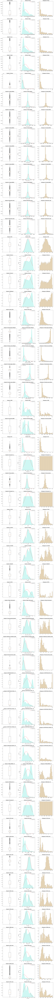

In [19]:
# Boxplot, histogram and density plot for numerical features

if True:

    fig, axes = plt.subplots(nrows = len(col_nums), ncols = 3, figsize = (15, 5 * len(col_nums)))

    if len(col_nums) == 1:

        axes = axes.reshape(1, 3)

    for i, col in enumerate(col_nums):

        # Histogram

        axes[i, 2].hist(df[col].dropna(), bins = 30, edgecolor = "black", alpha = 0.7, color = "moccasin")
        axes[i, 2].set_title(f"Histogram of {col}", fontweight = 'bold')

        # Density

        sns.kdeplot(df[col], fill = True, ax = axes[i, 1], color = "turquoise")
        axes[i, 1].set_title(f"Density of {col}", fontweight = 'bold')

        # Normal distribution curve

        x = np.linspace(df[col].min(), df[col].max(), 200)
        p = st.norm.pdf(x, df[col].mean(), df[col].std())
        axes[i, 1].plot(x, p, 'r--', label = 'Normal Dist')
        axes[i, 1].legend()

        axes[i, 0].boxplot(df[col].dropna(), vert = 0) 
        axes[i, 0].set_title(f"Boxplot of {col}", fontweight = 'bold')       

    plt.tight_layout()

    # Save

    plt.savefig(os.path.join(EDA_CONTENT_PATH, 'numerical_features_distribution_for_5d_pred.png'), dpi = 300)

    plt.show()

# 5.1. Numerical Fatures by Intervals

In [20]:
# Function to generate frequency tables for numerical variables grouped by intervals


def table_num_intervals(df, col, bins = int):

    # Creation of intervals

    ranges = pd.cut(df[col], bins = bins)

    # Grouping by intervals and counting records in each interval

    table = (
        df.groupby(ranges, observed = False)[col]
          .count()
          .reset_index(name = "Count")
          .sort_values(by = col)   
          .reset_index(drop = True)
    )

    # Percentage for each intergak

    table["Percentage"] = (table["Count"] / len(df) * 100)

    # Format percentage to two decimal places

    table["Percentage"] = table["Percentage"].map(lambda x: f"{x:.2f}%")

    return table

In [21]:
# Invoke the function for each numerical column and display the frequency tables

if True:

    for col in col_nums:

        print(f"\nFrequency Table for {col} grouped into 10 intervals:")

        display(table_num_intervals(df, col, bins = 10))


Frequency Table for Close grouped into 10 intervals:


,Close,Count,Percentage
0,"(85.953, 12664.699]",2010,50.66%
1,"(12664.699, 25118.902]",386,9.73%
2,"(25118.902, 37573.106]",396,9.98%
3,"(37573.106, 50027.309]",329,8.29%
4,"(50027.309, 62481.513]",227,5.72%
5,"(62481.513, 74935.717]",182,4.59%
6,"(74935.717, 87389.92]",67,1.69%
7,"(87389.92, 99844.124]",149,3.76%
8,"(99844.124, 112298.328]",140,3.53%
9,"(112298.328, 124752.531]",79,1.99%



Frequency Table for High grouped into 10 intervals:


,High,Count,Percentage
0,"(97.859, 12821.257]",2006,50.55%
1,"(12821.257, 25418.68]",388,9.78%
2,"(25418.68, 38016.104]",382,9.63%
3,"(38016.104, 50613.528]",332,8.37%
4,"(50613.528, 63210.952]",226,5.70%
5,"(63210.952, 75808.375]",196,4.94%
6,"(75808.375, 88405.799]",56,1.41%
7,"(88405.799, 101003.223]",155,3.91%
8,"(101003.223, 113600.647]",142,3.58%
9,"(113600.647, 126198.07]",82,2.07%



Frequency Table for Low grouped into 10 intervals:


,Low,Count,Percentage
0,"(76.571, 12499.215]",2016,50.81%
1,"(12499.215, 24798.863]",382,9.63%
2,"(24798.863, 37098.511]",410,10.33%
3,"(37098.511, 49398.159]",326,8.22%
4,"(49398.159, 61697.807]",231,5.82%
5,"(61697.807, 73997.455]",166,4.18%
6,"(73997.455, 86297.103]",73,1.84%
7,"(86297.103, 98596.751]",150,3.78%
8,"(98596.751, 110896.399]",135,3.40%
9,"(110896.399, 123196.047]",76,1.92%



Frequency Table for Open grouped into 10 intervals:


,Open,Count,Percentage
0,"(85.526, 12664.275]",2011,50.68%
1,"(12664.275, 25118.483]",386,9.73%
2,"(25118.483, 37572.69]",396,9.98%
3,"(37572.69, 50026.897]",329,8.29%
4,"(50026.897, 62481.104]",227,5.72%
5,"(62481.104, 74935.312]",182,4.59%
6,"(74935.312, 87389.519]",67,1.69%
7,"(87389.519, 99843.726]",147,3.70%
8,"(99843.726, 112297.933]",141,3.55%
9,"(112297.933, 124752.141]",79,1.99%



Frequency Table for Volume grouped into 10 intervals:


,Volume,Count,Percentage
0,"(-340356440.579, 35106334957.9]",3022,76.16%
1,"(35106334957.9, 70202069015.8]",787,19.83%
2,"(70202069015.8, 105297803073.7]",133,3.35%
3,"(105297803073.7, 140393537131.6]",19,0.48%
4,"(140393537131.6, 175489271189.5]",2,0.05%
5,"(175489271189.5, 210585005247.4]",1,0.03%
6,"(210585005247.4, 245680739305.3]",0,0.00%
7,"(245680739305.3, 280776473363.2]",0,0.00%
8,"(280776473363.2, 315872207421.1]",0,0.00%
9,"(315872207421.1, 350967941479.0]",1,0.03%



Frequency Table for Scaled_SMA20 grouped into 10 intervals:


,Scaled_SMA20,Count,Percentage
0,"(-15476.369, -12230.109]",6,0.15%
1,"(-12230.109, -9015.991]",20,0.50%
2,"(-9015.991, -5801.872]",65,1.64%
3,"(-5801.872, -2587.753]",239,6.02%
4,"(-2587.753, 626.365]",2530,63.76%
5,"(626.365, 3840.484]",776,19.56%
6,"(3840.484, 7054.603]",211,5.32%
7,"(7054.603, 10268.721]",73,1.84%
8,"(10268.721, 13482.84]",20,0.50%
9,"(13482.84, 16696.959]",6,0.15%



Frequency Table for Scaled_SMA50 grouped into 10 intervals:


,Scaled_SMA50,Count,Percentage
0,"(-22646.299, -17774.07]",7,0.18%
1,"(-17774.07, -12950.081]",27,0.68%
2,"(-12950.081, -8126.091]",105,2.65%
3,"(-8126.091, -3302.102]",292,7.36%
4,"(-3302.102, 1521.887]",2473,62.32%
5,"(1521.887, 6345.876]",673,16.96%
6,"(6345.876, 11169.865]",217,5.47%
7,"(11169.865, 15993.855]",77,1.94%
8,"(15993.855, 20817.844]",36,0.91%
9,"(20817.844, 25641.833]",9,0.23%



Frequency Table for Scaled_EMA20 grouped into 10 intervals:


,Scaled_EMA20,Count,Percentage
0,"(-13050.561, -10192.741]",8,0.20%
1,"(-10192.741, -7363.216]",18,0.45%
2,"(-7363.216, -4533.692]",83,2.09%
3,"(-4533.692, -1704.167]",329,8.29%
4,"(-1704.167, 1125.358]",2766,69.71%
5,"(1125.358, 3954.882]",525,13.23%
6,"(3954.882, 6784.407]",162,4.08%
7,"(6784.407, 9613.932]",54,1.36%
8,"(9613.932, 12443.456]",15,0.38%
9,"(12443.456, 15272.981]",5,0.13%



Frequency Table for Scaled_EMA50 grouped into 10 intervals:


,Scaled_EMA50,Count,Percentage
0,"(-19285.05, -15094.889]",6,0.15%
1,"(-15094.889, -10946.214]",23,0.58%
2,"(-10946.214, -6797.539]",105,2.65%
3,"(-6797.539, -2648.865]",289,7.28%
4,"(-2648.865, 1499.81]",2578,64.97%
5,"(1499.81, 5648.484]",625,15.75%
6,"(5648.484, 9797.159]",218,5.49%
7,"(9797.159, 13945.834]",75,1.89%
8,"(13945.834, 18094.508]",37,0.93%
9,"(18094.508, 22243.183]",9,0.23%



Frequency Table for Scaled_HMA20 grouped into 10 intervals:


,Scaled_HMA20,Count,Percentage
0,"(-11682.018, -9441.875]",2,0.05%
1,"(-9441.875, -7223.912]",5,0.13%
2,"(-7223.912, -5005.949]",34,0.86%
3,"(-5005.949, -2787.985]",141,3.55%
4,"(-2787.985, -570.022]",562,14.16%
5,"(-570.022, 1647.941]",2814,70.92%
6,"(1647.941, 3865.905]",296,7.46%
7,"(3865.905, 6083.868]",76,1.92%
8,"(6083.868, 8301.831]",11,0.28%
9,"(8301.831, 10519.795]",2,0.05%



Frequency Table for Scaled_HMA50 grouped into 10 intervals:


,Scaled_HMA50,Count,Percentage
0,"(-13598.941, -10771.398]",4,0.10%
1,"(-10771.398, -7971.851]",30,0.76%
2,"(-7971.851, -5172.303]",99,2.49%
3,"(-5172.303, -2372.756]",262,6.60%
4,"(-2372.756, 426.792]",2397,60.41%
5,"(426.792, 3226.339]",802,20.21%
6,"(3226.339, 6025.887]",223,5.62%
7,"(6025.887, 8825.434]",80,2.02%
8,"(8825.434, 11624.982]",10,0.25%
9,"(11624.982, 14424.53]",3,0.08%



Frequency Table for Momentum_20p grouped into 10 intervals:


,Momentum_20p,Count,Percentage
0,"(-26047.459, -20371.908]",8,0.20%
1,"(-20371.908, -14752.55]",21,0.53%
2,"(-14752.55, -9133.192]",92,2.32%
3,"(-9133.192, -3513.834]",330,8.32%
4,"(-3513.834, 2105.523]",2682,67.59%
5,"(2105.523, 7724.881]",550,13.86%
6,"(7724.881, 13344.239]",176,4.44%
7,"(13344.239, 18963.597]",57,1.44%
8,"(18963.597, 24582.955]",25,0.63%
9,"(24582.955, 30202.312]",4,0.10%



Frequency Table for Momentum_50p grouped into 10 intervals:


,Momentum_50p,Count,Percentage
0,"(-37694.028, -30032.529]",9,0.23%
1,"(-30032.529, -22446.885]",30,0.76%
2,"(-22446.885, -14861.242]",114,2.87%
3,"(-14861.242, -7275.598]",209,5.27%
4,"(-7275.598, 310.045]",1852,46.67%
5,"(310.045, 7895.688]",1163,29.31%
6,"(7895.688, 15481.332]",311,7.84%
7,"(15481.332, 23066.975]",128,3.23%
8,"(23066.975, 30652.618]",71,1.79%
9,"(30652.618, 38238.262]",28,0.71%



Frequency Table for RSI grouped into 10 intervals:


,RSI,Count,Percentage
0,"(4.604, 14.206]",27,0.68%
1,"(14.206, 23.713]",147,3.70%
2,"(23.713, 33.219]",364,9.17%
3,"(33.219, 42.726]",573,14.44%
4,"(42.726, 52.233]",778,19.61%
5,"(52.233, 61.739]",744,18.75%
6,"(61.739, 71.246]",565,14.24%
7,"(71.246, 80.752]",406,10.23%
8,"(80.752, 90.259]",273,6.88%
9,"(90.259, 99.766]",74,1.86%



Frequency Table for Stoch_K grouped into 10 intervals:


,Stoch_K,Count,Percentage
0,"(-0.1, 10.0]",256,6.45%
1,"(10.0, 20.0]",373,9.40%
2,"(20.0, 30.0]",358,9.02%
3,"(30.0, 40.0]",368,9.27%
4,"(40.0, 50.0]",390,9.83%
5,"(50.0, 60.0]",314,7.91%
6,"(60.0, 70.0]",361,9.10%
7,"(70.0, 80.0]",374,9.43%
8,"(80.0, 90.0]",516,13.00%
9,"(90.0, 100.0]",642,16.18%



Frequency Table for Stoch_D grouped into 10 intervals:


,Stoch_D,Count,Percentage
0,"(1.272, 11.153]",180,4.54%
1,"(11.153, 20.936]",423,10.66%
2,"(20.936, 30.719]",376,9.48%
3,"(30.719, 40.501]",377,9.50%
4,"(40.501, 50.284]",367,9.25%
5,"(50.284, 60.067]",341,8.59%
6,"(60.067, 69.85]",342,8.62%
7,"(69.85, 79.633]",437,11.01%
8,"(79.633, 89.416]",573,14.44%
9,"(89.416, 99.199]",534,13.46%



Frequency Table for WilliamsR grouped into 10 intervals:


,WilliamsR,Count,Percentage
0,"(-100.1, -90.0]",247,6.22%
1,"(-90.0, -80.0]",377,9.50%
2,"(-80.0, -70.0]",377,9.50%
3,"(-70.0, -60.0]",382,9.63%
4,"(-60.0, -50.0]",386,9.73%
5,"(-50.0, -40.0]",295,7.43%
6,"(-40.0, -30.0]",333,8.39%
7,"(-30.0, -20.0]",382,9.63%
8,"(-20.0, -10.0]",488,12.30%
9,"(-10.0, -0.0]",678,17.09%



Frequency Table for Norm_ATR grouped into 10 intervals:


,Norm_ATR,Count,Percentage
0,"(0.00578, 0.0219]",520,13.10%
1,"(0.0219, 0.0378]",1493,37.63%
2,"(0.0378, 0.0537]",1107,27.90%
3,"(0.0537, 0.0696]",378,9.53%
4,"(0.0696, 0.0855]",207,5.22%
5,"(0.0855, 0.101]",123,3.10%
6,"(0.101, 0.117]",49,1.23%
7,"(0.117, 0.133]",44,1.11%
8,"(0.133, 0.149]",26,0.66%
9,"(0.149, 0.165]",5,0.13%



Frequency Table for Scaled_Upper_Bollinger grouped into 10 intervals:


,Scaled_Upper_Bollinger,Count,Percentage
0,"(-30491.671, -26828.15]",7,0.18%
1,"(-26828.15, -23200.901]",8,0.20%
2,"(-23200.901, -19573.652]",16,0.40%
3,"(-19573.652, -15946.402]",25,0.63%
4,"(-15946.402, -12319.153]",62,1.56%
5,"(-12319.153, -8691.904]",181,4.56%
6,"(-8691.904, -5064.655]",404,10.18%
7,"(-5064.655, -1437.406]",972,24.50%
8,"(-1437.406, 2189.843]",2263,57.03%
9,"(2189.843, 5817.092]",7,0.18%



Frequency Table for Scaled_Lower_Bollinger grouped into 10 intervals:


,Scaled_Lower_Bollinger,Count,Percentage
0,"(-4495.904, -410.286]",58,1.46%
1,"(-410.286, 3634.879]",2861,72.10%
2,"(3634.879, 7680.045]",539,13.58%
3,"(7680.045, 11725.211]",268,6.75%
4,"(11725.211, 15770.377]",111,2.80%
5,"(15770.377, 19815.542]",57,1.44%
6,"(19815.542, 23860.708]",30,0.76%
7,"(23860.708, 27905.874]",7,0.18%
8,"(27905.874, 31951.039]",10,0.25%
9,"(31951.039, 35996.205]",4,0.10%



Frequency Table for Scaled_Upper_Keltner grouped into 10 intervals:


,Scaled_Upper_Keltner,Count,Percentage
0,"(-21662.271, -18488.704]",9,0.23%
1,"(-18488.704, -15346.559]",23,0.58%
2,"(-15346.559, -12204.414]",59,1.49%
3,"(-12204.414, -9062.269]",139,3.50%
4,"(-9062.269, -5920.124]",307,7.74%
5,"(-5920.124, -2777.979]",505,12.73%
6,"(-2777.979, 364.165]",2597,65.45%
7,"(364.165, 3506.31]",275,6.93%
8,"(3506.31, 6648.455]",26,0.66%
9,"(6648.455, 9790.6]",5,0.13%



Frequency Table for Scaled_Lower_Keltner grouped into 10 intervals:


,Scaled_Lower_Keltner,Count,Percentage
0,"(-4954.333, -2308.868]",23,0.58%
1,"(-2308.868, 310.405]",1256,31.65%
2,"(310.405, 2929.678]",1470,37.05%
3,"(2929.678, 5548.95]",499,12.58%
4,"(5548.95, 8168.223]",350,8.82%
5,"(8168.223, 10787.496]",192,4.84%
6,"(10787.496, 13406.769]",87,2.19%
7,"(13406.769, 16026.041]",49,1.23%
8,"(16026.041, 18645.314]",13,0.33%
9,"(18645.314, 21264.587]",6,0.15%



Frequency Table for OBV grouped into 10 intervals:


,OBV,Count,Percentage
0,"(-2862597217.482, 274417643448.2]",1497,37.73%
1,"(274417643448.2, 548952535196.4]",193,4.86%
2,"(548952535196.4, 823487426944.6]",273,6.88%
3,"(823487426944.6, 1098022318692.8]",150,3.78%
4,"(1098022318692.8, 1372557210441.0]",545,13.73%
5,"(1372557210441.0, 1647092102189.2]",290,7.31%
6,"(1647092102189.2, 1921626993937.4]",494,12.45%
7,"(1921626993937.4, 2196161885685.6]",381,9.60%
8,"(2196161885685.6, 2470696777433.8]",109,2.75%
9,"(2470696777433.8, 2745231669182.0]",33,0.83%



Frequency Table for Anchored_VWAP grouped into 10 intervals:


,Anchored_VWAP,Count,Percentage
0,"(194.239, 5290.383]",1003,25.28%
1,"(5290.383, 10336.07]",1034,26.06%
2,"(10336.07, 15381.757]",147,3.70%
3,"(15381.757, 20427.444]",63,1.59%
4,"(20427.444, 25473.132]",190,4.79%
5,"(25473.132, 30518.819]",979,24.67%
6,"(30518.819, 35564.506]",163,4.11%
7,"(35564.506, 40610.193]",151,3.81%
8,"(40610.193, 45655.88]",95,2.39%
9,"(45655.88, 50701.568]",139,3.50%



Frequency Table for ILV grouped into 10 intervals:


,ILV,Count,Percentage
0,"(0.00212, 0.0513]",2882,72.63%
1,"(0.0513, 0.1]",829,20.89%
2,"(0.1, 0.149]",174,4.39%
3,"(0.149, 0.197]",56,1.41%
4,"(0.197, 0.246]",15,0.38%
5,"(0.246, 0.295]",4,0.10%
6,"(0.295, 0.343]",2,0.05%
7,"(0.343, 0.392]",2,0.05%
8,"(0.392, 0.441]",0,0.00%
9,"(0.441, 0.489]",1,0.03%



Frequency Table for Unnamed: 0_x grouped into 10 intervals:


,Unnamed: 0_x,Count,Percentage
0,"(-3.961, 396.1]",397,10.01%
1,"(396.1, 792.2]",396,9.98%
2,"(792.2, 1188.3]",396,9.98%
3,"(1188.3, 1584.4]",396,9.98%
4,"(1584.4, 1980.5]",396,9.98%
5,"(1980.5, 2376.6]",396,9.98%
6,"(2376.6, 2772.7]",396,9.98%
7,"(2772.7, 3168.8]",396,9.98%
8,"(3168.8, 3564.9]",396,9.98%
9,"(3564.9, 3961.0]",397,10.01%



Frequency Table for Future_Return grouped into 10 intervals:


,Future_Return,Count,Percentage
0,"(-0.443, -0.336]",3,0.08%
1,"(-0.336, -0.23]",16,0.40%
2,"(-0.23, -0.125]",139,3.50%
3,"(-0.125, -0.0187]",1057,26.64%
4,"(-0.0187, 0.0871]",2231,56.22%
5,"(0.0871, 0.193]",429,10.81%
6,"(0.193, 0.299]",80,2.02%
7,"(0.299, 0.405]",4,0.10%
8,"(0.405, 0.51]",2,0.05%
9,"(0.51, 0.616]",1,0.03%



Frequency Table for Unnamed: 0_y grouped into 10 intervals:


,Unnamed: 0_y,Count,Percentage
0,"(-2.869, 286.9]",287,7.23%
1,"(286.9, 573.8]",287,7.23%
2,"(573.8, 860.7]",287,7.23%
3,"(860.7, 1147.6]",287,7.23%
4,"(1147.6, 1434.5]",287,7.23%
5,"(1434.5, 1721.4]",287,7.23%
6,"(1721.4, 2008.3]",287,7.23%
7,"(2008.3, 2295.2]",287,7.23%
8,"(2295.2, 2582.1]",287,7.23%
9,"(2582.1, 2869.0]",287,7.23%



Frequency Table for T5YIE grouped into 10 intervals:


,T5YIE,Count,Percentage
0,"(0.137, 0.485]",6,0.15%
1,"(0.485, 0.83]",43,1.08%
2,"(0.83, 1.175]",85,2.14%
3,"(1.175, 1.52]",389,9.80%
4,"(1.52, 1.865]",669,16.86%
5,"(1.865, 2.21]",482,12.15%
6,"(2.21, 2.555]",735,18.52%
7,"(2.555, 2.9]",211,5.32%
8,"(2.9, 3.245]",57,1.44%
9,"(3.245, 3.59]",39,0.98%



Frequency Table for T10Y2Y grouped into 10 intervals:


,T10Y2Y,Count,Percentage
0,"(-1.083, -0.795]",61,1.54%
1,"(-0.795, -0.51]",142,3.58%
2,"(-0.51, -0.225]",267,6.73%
3,"(-0.225, 0.06]",132,3.33%
4,"(0.06, 0.345]",574,14.47%
5,"(0.345, 0.63]",494,12.45%
6,"(0.63, 0.915]",320,8.06%
7,"(0.915, 1.2]",351,8.85%
8,"(1.2, 1.485]",278,7.01%
9,"(1.485, 1.77]",97,2.44%



Frequency Table for T10Y3M grouped into 10 intervals:


,T10Y3M,Count,Percentage
0,"(-1.894, -1.453]",111,2.80%
1,"(-1.453, -1.016]",240,6.05%
2,"(-1.016, -0.579]",128,3.23%
3,"(-0.579, -0.142]",113,2.85%
4,"(-0.142, 0.295]",490,12.35%
5,"(0.295, 0.732]",277,6.98%
6,"(0.732, 1.169]",339,8.54%
7,"(1.169, 1.606]",546,13.76%
8,"(1.606, 2.043]",313,7.89%
9,"(2.043, 2.48]",159,4.01%



Frequency Table for BAA10Y grouped into 10 intervals:


,BAA10Y,Count,Percentage
0,"(1.357, 1.655]",307,7.74%
1,"(1.655, 1.95]",781,19.68%
2,"(1.95, 2.245]",722,18.20%
3,"(2.245, 2.54]",330,8.32%
4,"(2.54, 2.835]",242,6.10%
5,"(2.835, 3.13]",140,3.53%
6,"(3.13, 3.425]",141,3.55%
7,"(3.425, 3.72]",33,0.83%
8,"(3.72, 4.015]",11,0.28%
9,"(4.015, 4.31]",5,0.13%



Frequency Table for EFFR grouped into 10 intervals:


,EFFR,Count,Percentage
0,"(0.0347, 0.569]",991,24.97%
1,"(0.569, 1.098]",164,4.13%
2,"(1.098, 1.627]",299,7.54%
3,"(1.627, 2.156]",192,4.84%
4,"(2.156, 2.685]",253,6.38%
5,"(2.685, 3.214]",29,0.73%
6,"(3.214, 3.743]",24,0.60%
7,"(3.743, 4.272]",85,2.14%
8,"(4.272, 4.801]",280,7.06%
9,"(4.801, 5.33]",411,10.36%



Frequency Table for High_Yield_Spread grouped into 10 intervals:


,High_Yield_Spread,Count,Percentage
0,"(2.582, 3.418]",765,19.28%
1,"(3.418, 4.246]",1041,26.23%
2,"(4.246, 5.074]",519,13.08%
3,"(5.074, 5.902]",224,5.65%
4,"(5.902, 6.73]",150,3.78%
5,"(6.73, 7.558]",65,1.64%
6,"(7.558, 8.386]",48,1.21%
7,"(8.386, 9.214]",16,0.40%
8,"(9.214, 10.042]",4,0.10%
9,"(10.042, 10.87]",4,0.10%



Frequency Table for Corporate_Bond_Spread grouped into 10 intervals:


,Corporate_Bond_Spread,Count,Percentage
0,"(1.825, 2.311]",268,6.75%
1,"(2.311, 2.792]",203,5.12%
2,"(2.792, 3.273]",305,7.69%
3,"(3.273, 3.754]",480,12.10%
4,"(3.754, 4.235]",434,10.94%
5,"(4.235, 4.716]",224,5.65%
6,"(4.716, 5.197]",291,7.33%
7,"(5.197, 5.678]",488,12.30%
8,"(5.678, 6.159]",103,2.60%
9,"(6.159, 6.64]",40,1.01%



Frequency Table for National_Conditions_Index grouped into 10 intervals:


,National_Conditions_Index,Count,Percentage
0,"(-0.695, -0.593]",84,2.12%
1,"(-0.593, -0.491]",200,5.04%
2,"(-0.491, -0.39]",110,2.77%
3,"(-0.39, -0.289]",94,2.37%
4,"(-0.289, -0.188]",43,1.08%
5,"(-0.188, -0.0862]",26,0.66%
6,"(-0.0862, 0.0151]",1,0.03%
7,"(0.0151, 0.116]",2,0.05%
8,"(0.116, 0.218]",2,0.05%
9,"(0.218, 0.319]",4,0.10%



Frequency Table for Financial_Stress_Index grouped into 10 intervals:


,Financial_Stress_Index,Count,Percentage
0,"(-0.983, -0.315]",315,7.94%
1,"(-0.315, 0.346]",204,5.14%
2,"(0.346, 1.006]",36,0.91%
3,"(1.006, 1.667]",4,0.10%
4,"(1.667, 2.328]",1,0.03%
5,"(2.328, 2.989]",2,0.05%
6,"(2.989, 3.65]",2,0.05%
7,"(3.65, 4.31]",0,0.00%
8,"(4.31, 4.971]",0,0.00%
9,"(4.971, 5.632]",2,0.05%



Frequency Table for CRYPTOCAP_BTC.D, 1D grouped into 10 intervals:


,"CRYPTOCAP_BTC.D, 1D",Count,Percentage
0,"(36.557, 42.878]",484,12.20%
1,"(42.878, 49.136]",492,12.40%
2,"(49.136, 55.393]",625,15.75%
3,"(55.393, 61.651]",807,20.34%
4,"(61.651, 67.909]",513,12.93%
5,"(67.909, 74.167]",247,6.22%
6,"(74.167, 80.425]",9,0.23%
7,"(80.425, 86.683]",9,0.23%
8,"(86.683, 92.941]",42,1.06%
9,"(92.941, 99.199]",740,18.65%



Frequency Table for CRYPTOCAP_TOTAL, 1D grouped into 10 intervals:


,"CRYPTOCAP_TOTAL, 1D",Count,Percentage
0,"(-1138645287.865, 424674231212.355]",2014,50.76%
1,"(424674231212.355, 846271138638.316]",182,4.59%
2,"(846271138638.316, 1267868046064.276]",508,12.80%
3,"(1267868046064.276, 1689464953490.236]",232,5.85%
4,"(1689464953490.236, 2111061860916.197]",264,6.65%
5,"(2111061860916.197, 2532658768342.158]",283,7.13%
6,"(2532658768342.158, 2954255675768.118]",146,3.68%
7,"(2954255675768.118, 3375852583194.079]",171,4.31%
8,"(3375852583194.079, 3797449490620.04]",101,2.55%
9,"(3797449490620.04, 4219046398046.0]",67,1.69%



Frequency Table for CRYPTOCAP_TOTAL2, 1D grouped into 10 intervals:


,"CRYPTOCAP_TOTAL2, 1D",Count,Percentage
0,"(-1692819438.209, 173392119018.745]",1951,49.17%
1,"(173392119018.745, 346743543233.551]",187,4.71%
2,"(346743543233.551, 520094967448.357]",178,4.49%
3,"(520094967448.357, 693446391663.163]",470,11.84%
4,"(693446391663.163, 866797815877.969]",171,4.31%
5,"(866797815877.969, 1040149240092.775]",303,7.64%
6,"(1040149240092.775, 1213500664307.582]",303,7.64%
7,"(1213500664307.582, 1386852088522.388]",207,5.22%
8,"(1386852088522.388, 1560203512737.194]",139,3.50%
9,"(1560203512737.194, 1733554936952.0]",59,1.49%



Frequency Table for CRYPTOCAP_TOTALES, 1D grouped into 10 intervals:


,"CRYPTOCAP_TOTALES, 1D",Count,Percentage
0,"(-859078058.796, 396692096665.6]",1995,50.28%
1,"(396692096665.6, 790307121145.2]",262,6.60%
2,"(790307121145.2, 1183922145624.8]",458,11.54%
3,"(1183922145624.8, 1577537170104.4]",227,5.72%
4,"(1577537170104.4, 1971152194584.0]",251,6.33%
5,"(1971152194584.0, 2364767219063.6]",274,6.91%
6,"(2364767219063.6, 2758382243543.2]",175,4.41%
7,"(2758382243543.2, 3151997268022.8]",158,3.98%
8,"(3151997268022.8, 3545612292502.4]",105,2.65%
9,"(3545612292502.4, 3939227316982.0]",63,1.59%



Frequency Table for CRYPTOCAP_USDT.D, 1D grouped into 10 intervals:


,"CRYPTOCAP_USDT.D, 1D",Count,Percentage
0,"(-0.00327, 0.933]",1202,30.29%
1,"(0.933, 1.861]",505,12.73%
2,"(1.861, 2.788]",331,8.34%
3,"(2.788, 3.715]",303,7.64%
4,"(3.715, 4.642]",509,12.83%
5,"(4.642, 5.57]",364,9.17%
6,"(5.57, 6.497]",263,6.63%
7,"(6.497, 7.424]",255,6.43%
8,"(7.424, 8.352]",198,4.99%
9,"(8.352, 9.279]",37,0.93%



Frequency Table for FRED_WM2NS, 1D grouped into 10 intervals:


,"FRED_WM2NS, 1D",Count,Percentage
0,"(11851031800000.0, 12918420000000.0]",74,1.86%
1,"(12918420000000.0, 13975240000000.0]",83,2.09%
2,"(13975240000000.0, 15032060000000.0]",81,2.04%
3,"(15032060000000.0, 16088880000000.0]",25,0.63%
4,"(16088880000000.0, 17145700000000.0]",4,0.10%
5,"(17145700000000.0, 18202520000000.0]",12,0.30%
6,"(18202520000000.0, 19259340000000.0]",23,0.58%
7,"(19259340000000.0, 20316160000000.0]",22,0.55%
8,"(20316160000000.0, 21372980000000.0]",127,3.20%
9,"(21372980000000.0, 22429800000000.0]",110,2.77%



Frequency Table for INDEX_BDI, 1D grouped into 10 intervals:


,"INDEX_BDI, 1D",Count,Percentage
0,"(284.64, 826.0]",558,14.06%
1,"(826.0, 1362.0]",796,20.06%
2,"(1362.0, 1898.0]",737,18.57%
3,"(1898.0, 2434.0]",380,9.58%
4,"(2434.0, 2970.0]",99,2.49%
5,"(2970.0, 3506.0]",79,1.99%
6,"(3506.0, 4042.0]",16,0.40%
7,"(4042.0, 4578.0]",18,0.45%
8,"(4578.0, 5114.0]",10,0.25%
9,"(5114.0, 5650.0]",11,0.28%



Frequency Table for Unnamed: 0 grouped into 10 intervals:


,Unnamed: 0,Count,Percentage
0,"(-2.732, 273.2]",274,6.91%
1,"(273.2, 546.4]",273,6.88%
2,"(546.4, 819.6]",273,6.88%
3,"(819.6, 1092.8]",273,6.88%
4,"(1092.8, 1366.0]",274,6.91%
5,"(1366.0, 1639.2]",273,6.88%
6,"(1639.2, 1912.4]",273,6.88%
7,"(1912.4, 2185.6]",273,6.88%
8,"(2185.6, 2458.8]",273,6.88%
9,"(2458.8, 2732.0]",274,6.91%



Frequency Table for VIX_close grouped into 10 intervals:


,VIX_close,Count,Percentage
0,"(9.066, 16.495]",1368,34.48%
1,"(16.495, 23.85]",910,22.93%
2,"(23.85, 31.205]",330,8.32%
3,"(31.205, 38.56]",80,2.02%
4,"(38.56, 45.915]",20,0.50%
5,"(45.915, 53.27]",6,0.15%
6,"(53.27, 60.625]",6,0.15%
7,"(60.625, 67.98]",6,0.15%
8,"(67.98, 75.335]",1,0.03%
9,"(75.335, 82.69]",4,0.10%



Frequency Table for GOLD_close grouped into 10 intervals:


,GOLD_close,Count,Percentage
0,"(1047.225, 1408.35]",1084,27.32%
1,"(1408.35, 1765.9]",398,10.03%
2,"(1765.9, 2123.45]",778,19.61%
3,"(2123.45, 2481.0]",115,2.90%
4,"(2481.0, 2838.55]",117,2.95%
5,"(2838.55, 3196.1]",48,1.21%
6,"(3196.1, 3553.65]",97,2.44%
7,"(3553.65, 3911.2]",23,0.58%
8,"(3911.2, 4268.75]",45,1.13%
9,"(4268.75, 4626.3]",25,0.63%



Frequency Table for OIL_close grouped into 10 intervals:


,OIL_close,Count,Percentage
0,"(-37.791, -21.497]",1,0.03%
1,"(-21.497, -5.364]",0,0.00%
2,"(-5.364, 10.769]",1,0.03%
3,"(10.769, 26.902]",39,0.98%
4,"(26.902, 43.035]",276,6.96%
5,"(43.035, 59.168]",900,22.68%
6,"(59.168, 75.301]",926,23.34%
7,"(75.301, 91.434]",455,11.47%
8,"(91.434, 107.567]",85,2.14%
9,"(107.567, 123.7]",48,1.21%



Frequency Table for TLT_close grouped into 10 intervals:


,TLT_close,Count,Percentage
0,"(74.196, 81.218]",57,1.44%
1,"(81.218, 88.171]",544,13.71%
2,"(88.171, 95.123]",674,16.99%
3,"(95.123, 102.075]",611,15.40%
4,"(102.075, 109.028]",164,4.13%
5,"(109.028, 115.98]",117,2.95%
6,"(115.98, 122.933]",198,4.99%
7,"(122.933, 129.885]",153,3.86%
8,"(129.885, 136.837]",114,2.87%
9,"(136.837, 143.79]",99,2.49%



Frequency Table for RSP_close grouped into 10 intervals:


,RSP_close,Count,Percentage
0,"(57.057, 71.261]",421,10.61%
1,"(71.261, 85.325]",346,8.72%
2,"(85.325, 99.388]",535,13.48%
3,"(99.388, 113.452]",141,3.55%
4,"(113.452, 127.515]",111,2.80%
5,"(127.515, 141.579]",424,10.69%
6,"(141.579, 155.642]",287,7.23%
7,"(155.642, 169.706]",160,4.03%
8,"(169.706, 183.77]",202,5.09%
9,"(183.77, 197.833]",104,2.62%



Frequency Table for TNX_close grouped into 10 intervals:


,TNX_close,Count,Percentage
0,"(0.495, 0.948]",200,5.04%
1,"(0.948, 1.397]",114,2.87%
2,"(1.397, 1.846]",459,11.57%
3,"(1.846, 2.295]",415,10.46%
4,"(2.295, 2.743]",376,9.48%
5,"(2.743, 3.192]",301,7.59%
6,"(3.192, 3.641]",119,3.00%
7,"(3.641, 4.09]",242,6.10%
8,"(4.09, 4.539]",420,10.58%
9,"(4.539, 4.988]",84,2.12%



Frequency Table for IWM_close grouped into 10 intervals:


,IWM_close,Count,Percentage
0,"(82.939, 101.079]",191,4.81%
1,"(101.079, 119.039]",295,7.43%
2,"(119.039, 137.0]",404,10.18%
3,"(137.0, 154.96]",515,12.98%
4,"(154.96, 172.92]",242,6.10%
5,"(172.92, 190.881]",305,7.69%
6,"(190.881, 208.841]",342,8.62%
7,"(208.841, 226.802]",305,7.69%
8,"(226.802, 244.762]",89,2.24%
9,"(244.762, 262.723]",43,1.08%



Frequency Table for UUP_close grouped into 10 intervals:


,UUP_close,Count,Percentage
0,"(19.331, 20.293]",160,4.03%
1,"(20.293, 21.246]",600,15.12%
2,"(21.246, 22.198]",681,17.16%
3,"(22.198, 23.15]",306,7.71%
4,"(23.15, 24.103]",117,2.95%
5,"(24.103, 25.055]",215,5.42%
6,"(25.055, 26.007]",182,4.59%
7,"(26.007, 26.96]",291,7.33%
8,"(26.96, 27.912]",124,3.12%
9,"(27.912, 28.864]",55,1.39%



Frequency Table for MSTR_close grouped into 10 intervals:


,MSTR_close,Count,Percentage
0,"(8.755, 55.681]",2013,50.73%
1,"(55.681, 102.142]",244,6.15%
2,"(102.142, 148.603]",88,2.22%
3,"(148.603, 195.064]",112,2.82%
4,"(195.064, 241.525]",22,0.55%
5,"(241.525, 287.986]",32,0.81%
6,"(287.986, 334.447]",69,1.74%
7,"(334.447, 380.908]",78,1.97%
8,"(380.908, 427.369]",66,1.66%
9,"(427.369, 473.83]",7,0.18%



Frequency Table for SPY_close grouped into 10 intervals:


,SPY_close,Count,Percentage
0,"(154.02, 208.43]",559,14.09%
1,"(208.43, 262.3]",557,14.04%
2,"(262.3, 316.171]",289,7.28%
3,"(316.171, 370.042]",199,5.02%
4,"(370.042, 423.913]",448,11.29%
5,"(423.913, 477.784]",189,4.76%
6,"(477.784, 531.654]",119,3.00%
7,"(531.654, 585.525]",158,3.98%
8,"(585.525, 639.396]",114,2.87%
9,"(639.396, 693.267]",99,2.49%


# 6.0. Categorical Features

In [22]:
#  Categorical features

col_cats = df.select_dtypes(include = ['object', 'category']).columns

# Pop the date pf the list

col_cats = col_cats.drop("date")

for col in col_cats:

    print(f'Column: {col}')
    print(df[col].value_counts(dropna = False))
    print("--" * 15)

Column: Relative_Volume_Category
Relative_Volume_Category
High         984
Very Low     984
Low          984
Very High    984
No Data       29
NaN            3
Name: count, dtype: int64
------------------------------
Column: Day_Type
Day_Type
Neutral         2169
Accumulation     980
Distribution     816
NaN                3
Name: count, dtype: int64
------------------------------
Column: Weekly_Breakout
Weekly_Breakout
Inside Range        3002
Bullish Breakout     595
Bearish Breakout     368
NaN                    3
Name: count, dtype: int64
------------------------------
Column: Target
Target
Bullish    1561
Neutral    1214
Bearish    1187
NaN           6
Name: count, dtype: int64
------------------------------


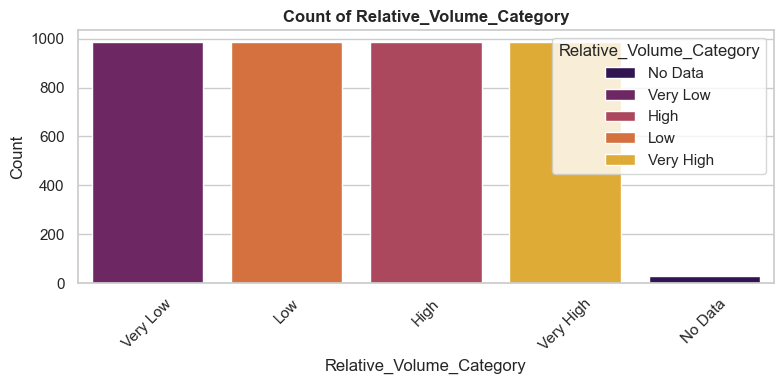

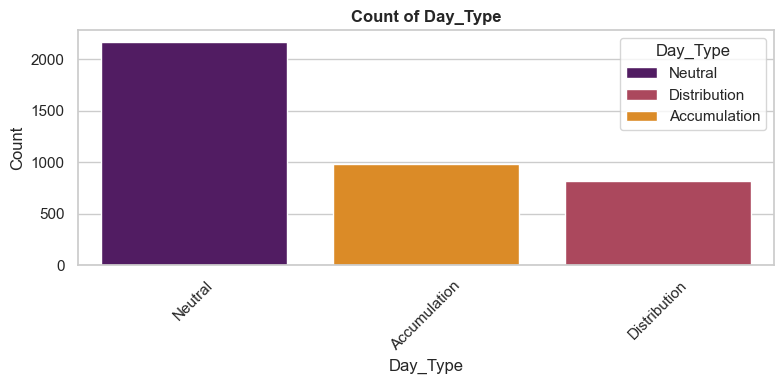

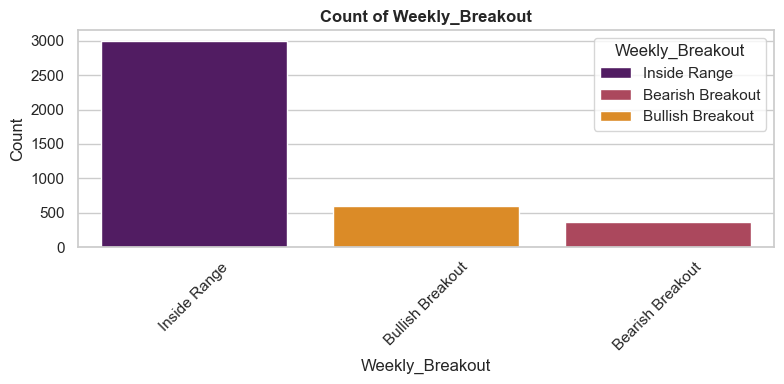

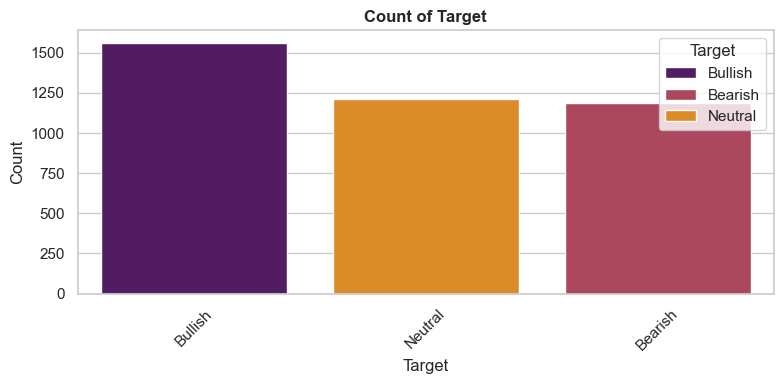

In [23]:
# In graphics...

sns.set_theme(style = "whitegrid")

for i, col in enumerate(col_cats):

    plt.figure(figsize = (8, 4))
    sns.countplot(data = df, x = col, hue = col, order = df[col].value_counts().index, palette = 'inferno')
    plt.xticks(rotation = 45)
    plt.title('Count of ' + col, fontsize = 12, fontweight = 'bold')
    plt.tight_layout()
    plt.xlabel(col)
    plt.ylabel('Count')

    # Save

    plt.savefig(os.path.join(EDA_CONTENT_PATH, f'{col}_distribution_for_5d_pred.png'), dpi = 300)

    plt.show()

# 7.0. Bivariate Numerical Analysis with Target Variable

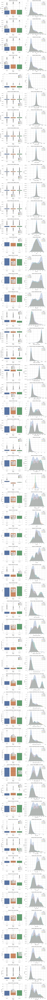

In [24]:
# Density graphics and histogram with respect to the target variable "Target"

if True:

    fig, axes = plt.subplots(nrows = len(col_nums), ncols = 2, figsize = (12, 4.5 * len(col_nums)))

    if len(col_nums) == 1:

        axes = axes.reshape(1, 2)

    for i, col in enumerate(col_nums):

        sns.kdeplot(data = df, x = col, hue = 'Target', fill = True, ax = axes[i, 1], warn_singular = False)
        axes[i, 1].set_title(f"Density of {col} by Target", fontweight = 'bold')

        sns.boxplot(data = df, x = 'Target', y = col, hue = 'Target', ax = axes[i, 0])
        axes[i, 0].set_title(f"Boxplot of {col} by Target", fontweight = 'bold')
        
    plt.tight_layout()

    # Save

    plt.savefig(os.path.join(EDA_CONTENT_PATH, 'numerical_features_by_target_for_5d_pred.png'), dpi = 300)

    plt.show()

# 7.1. Bivariate Categorical Analysis with Target Variable

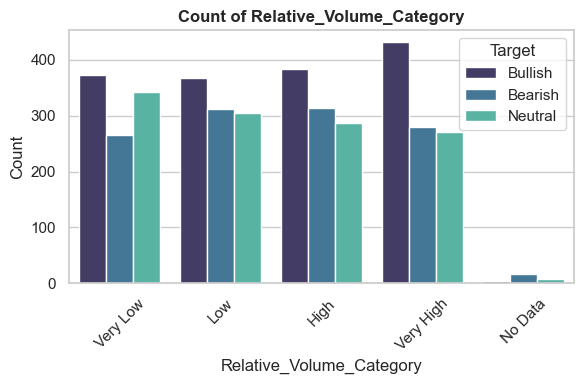

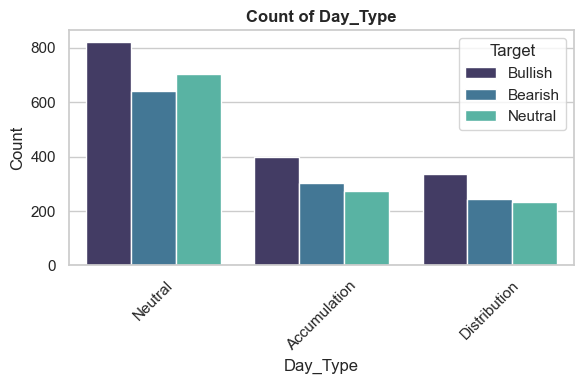

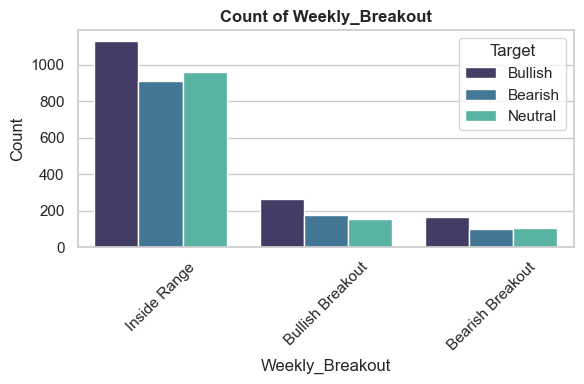

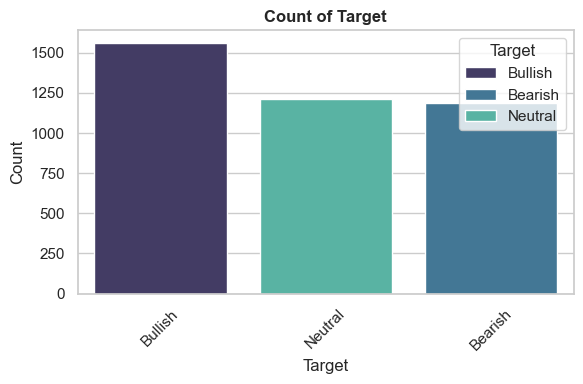

In [25]:
# Bivariate analysis od categorial features with respect to the target variable "Target"

sns.set_theme(style = "whitegrid")

for i, col in enumerate(col_cats):

    plt.figure(figsize = (6, 4))
    sns.countplot(data = df, x = col, hue = 'Target', order = df[col].value_counts().index, palette = 'mako')
    plt.xticks(rotation = 45)
    plt.title('Count of ' + col, fontsize = 12, fontweight = 'bold')
    plt.tight_layout()
    plt.xlabel(col)
    plt.ylabel('Count')

    # Save

    plt.savefig(os.path.join(EDA_CONTENT_PATH, f'{col}_by_target_distribution_for_5d_pred.png'), dpi = 300) 

    plt.show()

# 8.0. Correlation Matrix

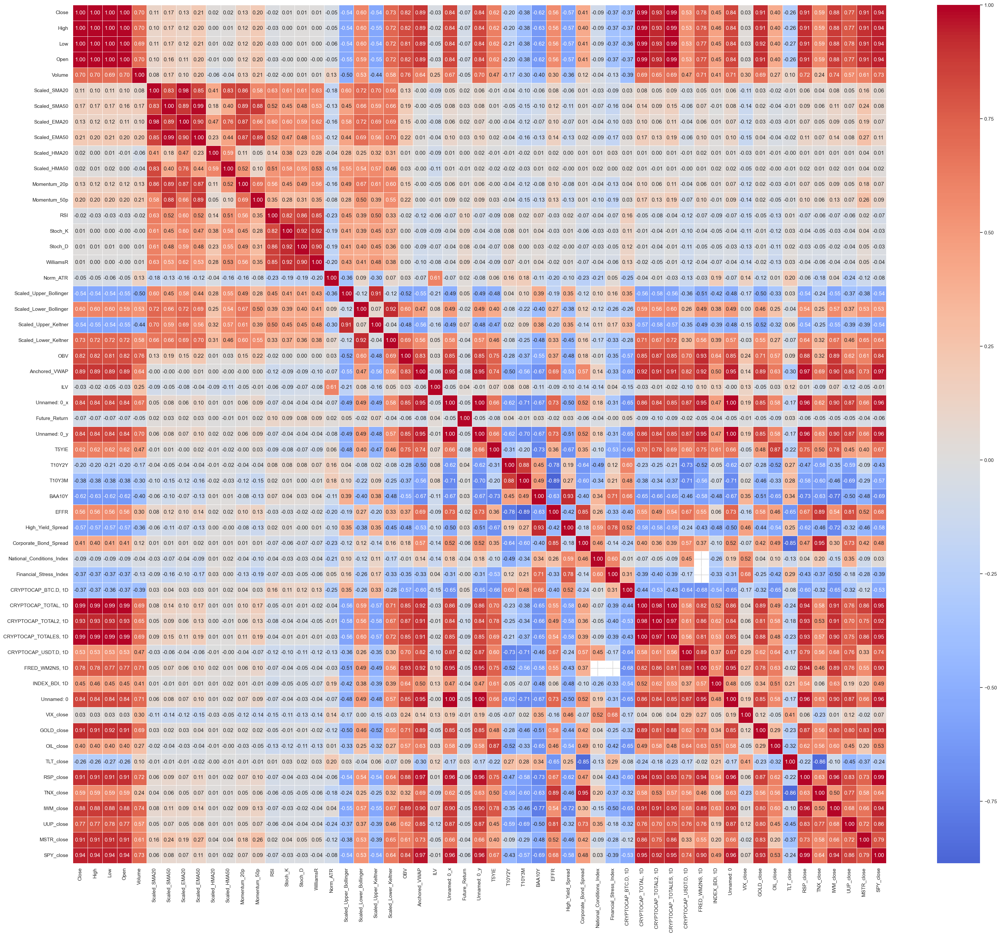

In [26]:
# Correlation Matriz (Pearson)

plt.figure(figsize = (40, 34))

sns.heatmap(df[col_nums].corr(method = 'pearson'), annot = True, cmap = 'coolwarm', fmt = '.2f', linewidths = 0.5, center = 0)

# Save

plt.savefig(os.path.join(EDA_CONTENT_PATH, 'correlation_matrix_pearson_for_5d_pred.png'), dpi = 300)

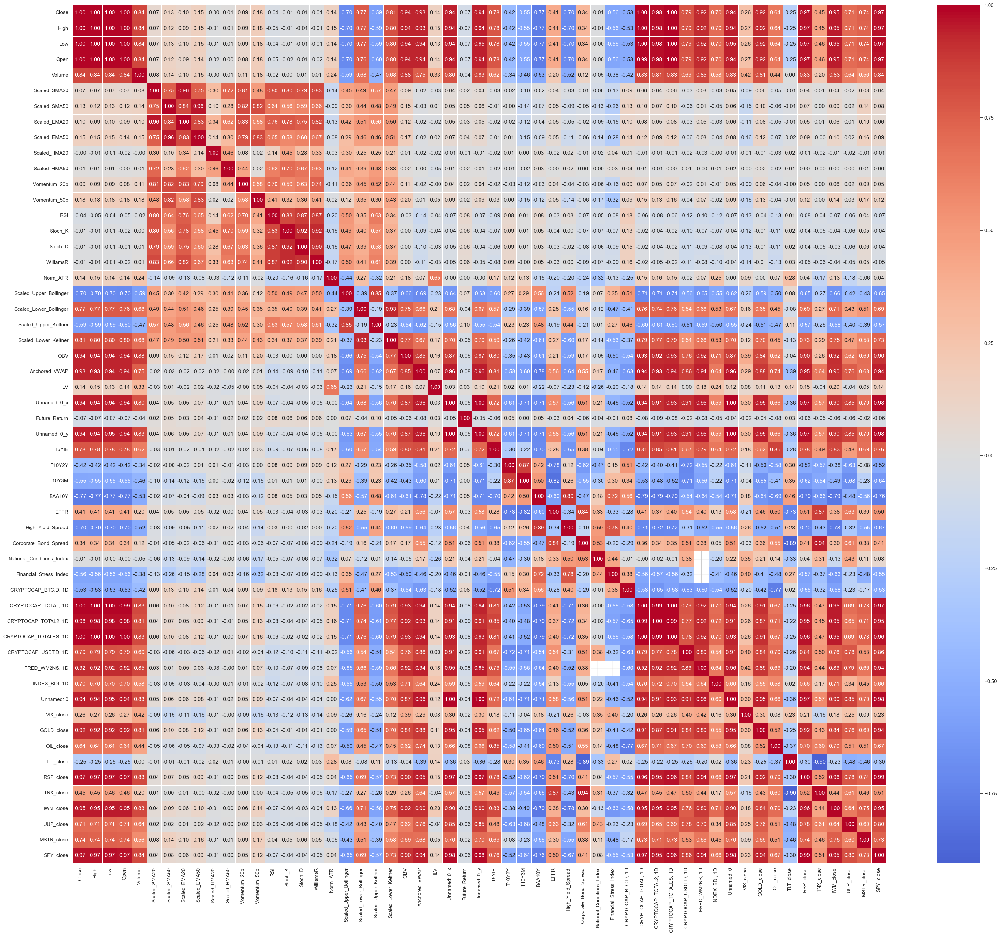

In [27]:
# Correlation Matriz (Spearman)

plt.figure(figsize = (40, 34))

sns.heatmap(df[col_nums].corr(method = 'spearman'), annot = True, cmap = 'coolwarm', fmt = '.2f', linewidths = 0.5, center = 0)

# Save

plt.savefig(os.path.join(EDA_CONTENT_PATH, 'correlation_matrix_spearman_for_5d_pred.png'), dpi = 300)

In [28]:
# Most correlated variables

umbral = 0.7

for i in range(len(df[col_nums].corr().columns)):

    for j in range(i):

        if abs(df[col_nums].corr().iloc[i, j]) > umbral:

            print(f"Variables with high correlation: {df[col_nums].corr().columns[i]} and {df[col_nums].corr().columns[j]} - Correlation: {df[col_nums].corr().iloc[i, j]:.2f}")

Variables with high correlation: High and Close - Correlation: 1.00
Variables with high correlation: Low and Close - Correlation: 1.00
Variables with high correlation: Low and High - Correlation: 1.00
Variables with high correlation: Open and Close - Correlation: 1.00
Variables with high correlation: Open and High - Correlation: 1.00
Variables with high correlation: Open and Low - Correlation: 1.00
Variables with high correlation: Volume and High - Correlation: 0.70
Variables with high correlation: Scaled_SMA50 and Scaled_SMA20 - Correlation: 0.83
Variables with high correlation: Scaled_EMA20 and Scaled_SMA20 - Correlation: 0.98
Variables with high correlation: Scaled_EMA20 and Scaled_SMA50 - Correlation: 0.89
Variables with high correlation: Scaled_EMA50 and Scaled_SMA20 - Correlation: 0.85
Variables with high correlation: Scaled_EMA50 and Scaled_SMA50 - Correlation: 0.99
Variables with high correlation: Scaled_EMA50 and Scaled_EMA20 - Correlation: 0.90
Variables with high correlation

# 9.0. Mutual Information Score

----------------------------------------
Mutual Information Scores for each feature:
Unnamed: 0_x                    0.467275
Anchored_VWAP                   0.343226
Unnamed: 0_y                    0.237305
Unnamed: 0                      0.215208
High                            0.107514
                                  ...   
National_Conditions_Index       0.000000
FRED_WM2NS, 1D                  0.000000
Relative_Volume_Category_Low    0.000000
Day_Type_Distribution           0.000000
Weekly_Breakout_Inside Range    0.000000
Length: 62, dtype: float64
----------------------------------------


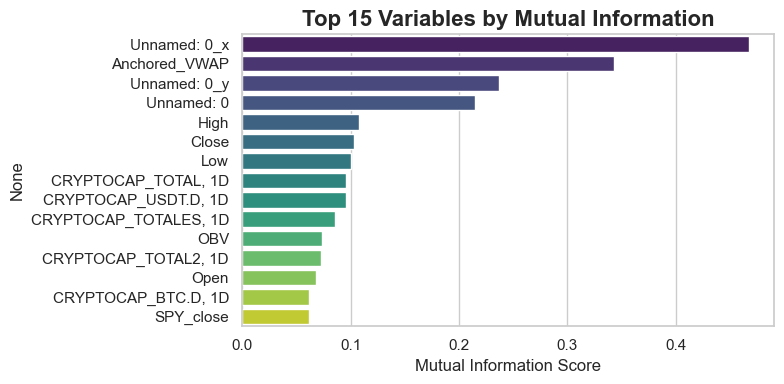

In [29]:
# Mutual Information Score

df2 = df.copy()

# Drop the date column

df2 = df2.drop(columns = ["date"])

# Eliminate "Future_Return" must be eliminated because it's used to calculate "Target"

df2 = df2.drop(columns = ["Future_Return"])

# Impute missing values before encoding

num_cols = df2.select_dtypes(include = ["int64", "float64"]).columns
cat_cols = df2.select_dtypes(include = ["object", "category"]).columns

# Impute numerical columns with median and categorical columns with mode

for col in num_cols:

    df2[col] = df2[col].fillna(df2[col].median())

for col in cat_cols:

    if df2[col].isna().any():

        df2[col] = df2[col].fillna(df2[col].mode().iloc[0])

# Separate features and target variable

X = df2.drop(columns = ["Target"])
y = df2["Target"]

# Convert categorical variables to numerical using one-hot encoding

X_encoded = pd.get_dummies(X, drop_first = True)

# Calculate Mutual Information Score for each feature

mi_scores = mutual_info_classif(X_encoded, y, discrete_features = 'auto')
mi_scores_series = pd.Series(mi_scores, index = X_encoded.columns).sort_values(ascending = False)

print("--" * 20)
print("Mutual Information Scores for each feature:")
print(mi_scores_series)
print("--" * 20)

# Top 15 Mutual Information

top_n = 15

plt.figure(figsize = (8, 4))
sns.barplot(x = mi_scores_series.values[:top_n], y = mi_scores_series.index[:top_n], hue = mi_scores_series.index[:top_n], palette = 'viridis', legend = False)
plt.title('Top 15 Variables by Mutual Information', fontsize = 16, fontweight = 'bold')
plt.xlabel('Mutual Information Score', fontsize = 12) 
plt.tight_layout()

# Save

plt.savefig(os.path.join(EDA_CONTENT_PATH, 'mutual_information_top15_for_5d_pred.png'), dpi = 300)

plt.show()

# 10.0. Feature Importance (Random Forest)

----------------------------------------
Random Forest Feature Importances:
Norm_ATR                              0.034646
CRYPTOCAP_BTC.D, 1D                   0.030953
Anchored_VWAP                         0.028990
CRYPTOCAP_USDT.D, 1D                  0.028254
Unnamed: 0_x                          0.028063
                                        ...   
Relative_Volume_Category_Very High    0.002294
Relative_Volume_Category_Very Low     0.002264
Day_Type_Distribution                 0.002015
Weekly_Breakout_Bullish Breakout      0.001493
Relative_Volume_Category_No Data      0.000144
Length: 62, dtype: float64
----------------------------------------


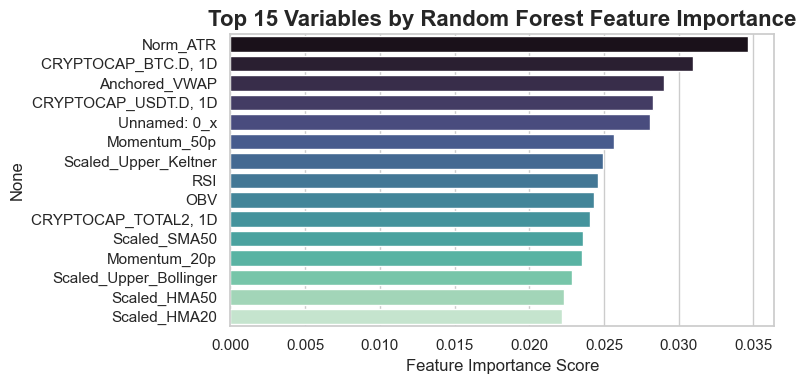

In [30]:
# RF: Feature Importance

# Prepare data for Random Forest

X_rf = X_encoded
y_rf = y

# Train a Random Forest Classifier

rf = RandomForestClassifier(n_estimators = 100, random_state = 42)
rf.fit(X_rf, y_rf)

# Get feature importance scores

feature_importances = pd.Series(rf.feature_importances_, index = X_rf.columns).sort_values(ascending = False)

print("--" * 20)
print("Random Forest Feature Importances:")
print(feature_importances)
print("--" * 20)

# Top 15 Feature Importances

top_n = 15
plt.figure(figsize = (8, 4))

sns.barplot(x = feature_importances.values[:top_n], y = feature_importances.index[:top_n], hue = feature_importances.index[:top_n], palette = 'mako', legend = False)
plt.title('Top 15 Variables by Random Forest Feature Importance', fontsize = 16, fontweight = 'bold')
plt.xlabel('Feature Importance Score', fontsize = 12)
plt.tight_layout()

# Save

plt.savefig(os.path.join(EDA_CONTENT_PATH, 'random_forest_feature_importance_top15_for_5d_pred.png'), dpi = 300)

plt.show()

# 11.0. SHAP

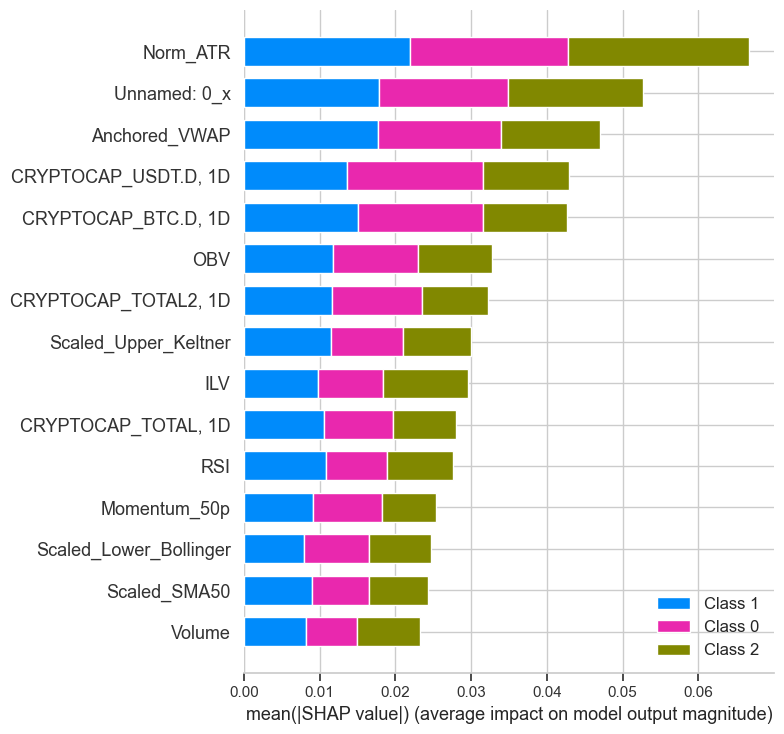

<Figure size 640x480 with 0 Axes>

In [31]:
# SHAP Values

# Train a Random Forest Classifier for SHAP

rf_shap = RandomForestClassifier(n_estimators = 100, random_state = 42)
rf_shap.fit(X_rf, y_rf)

# Create SHAP explainer and calculate SHAP values

explainer = shap.TreeExplainer(rf_shap)
shap_values = explainer.shap_values(X_rf)

shap_values_mean = np.mean(np.abs(shap_values), axis = 0)

# SHAP summary plot

shap.summary_plot(shap_values, X_rf, plot_type = "bar", max_display = 15, show = True)

# Save

plt.savefig(os.path.join(EDA_CONTENT_PATH, 'shap_summary_top15_for_5d_pred.png'), dpi = 300)

# 11.0. Autocorrelation

,autocorr,abs_autocorr,ljungbox_pvalue_lag20
Unnamed: 0_y,1.000000,1.000000,0.0
Unnamed: 0_x,1.000000,1.000000,0.0
Unnamed: 0,1.000000,1.000000,0.0
Anchored_VWAP,0.999391,0.999391,0.0
SPY_close,0.994039,0.994039,0.0
EFFR,0.993860,0.993860,0.0
GOLD_close,0.993615,0.993615,0.0
RSP_close,0.990127,0.990127,0.0
"FRED_WM2NS, 1D",0.989175,0.989175,0.0
High,0.988364,0.988364,0.0


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_65304\1846214970.py:58: UserWarning: The palette list has more values (15) than needed (13), which may not be intended.
  sns.barplot(hue = 'autocorr', y = 'feature', data = plot_df, palette = colors, dodge = False)


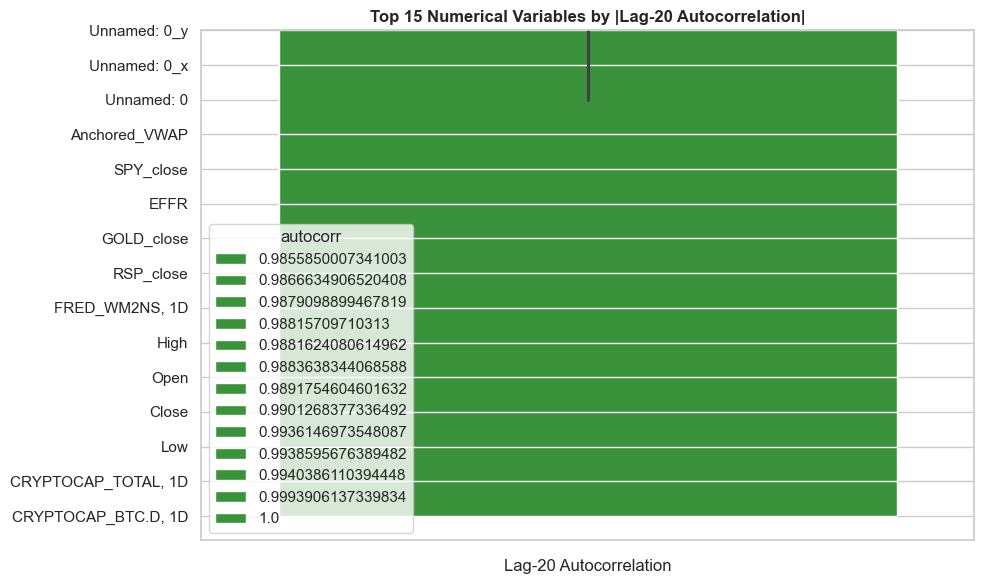

In [32]:

# Autocorrelation analysis (lag-20 = a month) and plot top 15 variables by absolute autocorrelation (suggested by AI)

# Compute lag-20 autocorrelation for numerical columns

autocorr = {}

for col in num_cols:

    s = df[col].dropna()

    autocorr[col] = s.autocorr(lag = 20) if s.size > 1 else np.nan

autocorr_df = pd.Series(autocorr, name = 'autocorr').dropna().to_frame()
autocorr_df['abs_autocorr'] = autocorr_df['autocorr'].abs()

# Top 15 by magnitude

top15 = autocorr_df.sort_values('abs_autocorr', ascending = False).head(15)

# Ljung-Box test (lag 20) p-value

try:

    lb_pvalues = []

    for c in top15.index:

        s = df[c].dropna()

        if s.size > 1:

            lb = acorr_ljungbox(s, lags = [20], return_df = True)

            lb_pvalues.append(lb['lb_pvalue'].iloc[-1])

        else:

            lb_pvalues.append(np.nan)

    top15['ljungbox_pvalue_lag20'] = lb_pvalues

except Exception:

    pass

# Display top15 table

display(top15)

# Plot horizontal bar chart showing sign and magnitude

plt.figure(figsize = (10, 6))

plot_df = top15.copy().reset_index().rename(columns = {'index': 'feature'})

colors = ['tab:green' if v >= 0 else 'tab:red' for v in plot_df['autocorr']]

sns.barplot(hue = 'autocorr', y = 'feature', data = plot_df, palette = colors, dodge = False)
plt.title('Top 15 Numerical Variables by |Lag-20 Autocorrelation|', fontsize = 12, fontweight = 'bold')
plt.xlabel('Lag-20 Autocorrelation')
plt.ylabel('')
plt.tight_layout()

# Save

plt.savefig(os.path.join(EDA_CONTENT_PATH, 'top15_autocorrelation1_for_5d_pred.png'), dpi = 300)

plt.show()